# Temperature Drought Index

* **Products used:** 
[ls5_st](https://explorer.digitalearth.africa/products/ls5_st),
[ls7_st](https://explorer.digitalearth.africa/products/ls7_st),
[ls8_st](https://explorer.digitalearth.africa/products/ls8_st),
[ls9_st](https://explorer.digitalearth.africa/products/ls9_st)

## Background


## Description



The notebook outlines:

***

## Getting started

To run this analysis, run all the cells in the notebook, starting with the "Load packages" cell. 

### Load packages


In [1]:
%matplotlib inline

import math
import os
import pickle
from datetime import datetime

import datacube
import geopandas as gpd
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
from datacube.utils.geometry import CRS, Geometry
from deafrica_tools.dask import create_local_dask_cluster
from deafrica_tools.datahandling import load_ard
from deafrica_tools.spatial import xr_rasterize

### Set up a Dask cluster

Dask can be used to better manage memory use and conduct the analysis in parallel. 
For an introduction to using Dask with Digital Earth Africa, see the [Dask notebook](../../Beginners_guide/08_Parallel_processing_with_dask.ipynb).

>**Note**: We recommend opening the Dask processing window to view the different computations that are being executed; to do this, see the *Dask dashboard in DE Africa* section of the [Dask notebook](../../Beginners_guide/08_Parallel_processing_with_dask.ipynb).

To use Dask, set up the local computing cluster using the cell below.

In [2]:
create_local_dask_cluster()

/env/lib/python3.8/site-packages/distributed/node.py:151: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 36685 instead
  warnings.warn(


Client Scheduler: tcp://127.0.0.1:41823 Dashboard: /user/victoria@kartoza.com/proxy/36685/status,Cluster Workers: 1 Cores: 15 Memory: 104.37 GB


### Analysis parameters

The following cell sets important parameters for the analysis:

* `vector_file`: file path for the shapefile containing polygons for the boundaries of Kenyan counties
* `attribute_col`: The column in the "vector_file" containing the county names.
* `county`: In this analysis, we'll select a Kenyan County to mask the dataset and analysis.
* `time_range`: Landsat surface temperature data is available from 1984. The time range to load data for is the year from which data is first available for to the end of the interest period.
* `resolution`:  The x and y cell resolution of the satellite data in metres (spatial resolution). If loading a large area, then increase the resolution so the data will fit into memory.
* `output_crs` : The coordinate reference system that the loaded data is to be reprojected to.
* `dask_chunks`:  the size of the dask chunks, dask breaks data into manageable chunks that can be easily stored in memory, e.g. `dict(x=1000,y=1000)`
* `output_dir` :  The directory in which to store results from the analysis.
* `products`: The Landsat surface temperature products to load.
* `measurements` : The `surface_temperature` band to load for the Landsat products.

**If running the notebook for the first time**, keep the default settings below.
This will demonstrate how the analysis works and provide meaningful results.


In [3]:
#vector_file = "../data/Kenya_Counties.geojson"
#attribute_col = "COUNTY_NAME"

vector_file = "../data/african_countries.geojson"
attribute_col = "COUNTRY"

# Select a county, for the example we will use Turkana County, a complete list of counties is available below.
#county = "Turkana"
county = "Ethiopia"

# Define the time range to load data for. 
time_range = ("1981", "2022")

# Set the x and y cell resolution of the satellite data.
# If loading a large area, then increase the resolution so the data will fit into memory.
# resolution = (-30, 30)
# Use the same resolution as CHIRPS which is ~5x5 km.
resolution = (-5000, 5000)

# Set the Coordinate Reference System (CRS) the satellite data is to be reprojected to.
output_crs = "EPSG:6933"

# Size of dask chunks.
dask_chunks = dict(x=5000, y=5000)

# Create the output directory to store the results.
output_dir = "results"
os.makedirs(output_dir, exist_ok=True)

# The Landsat surface temperature products and band to load.
products = ["ls5_st", "ls7_st", "ls8_st", "ls9_st"]
measurements = ["surface_temperature"]

### Connect to the datacube

Connect to the datacube so we can access DE Africa data.
The `app` parameter is a unique name for the analysis which is based on the notebook file name.

In [4]:
dc = datacube.Datacube(app="Temperature_Drought_Index")

### Load the Kenyan Counties shapefile

This shapefile contains polygons for the boundaries of Kenyan counties and will allows us to calculate the Temperature Drought Index within a chosen county.

In [5]:
kenyan_counties = gpd.read_file(vector_file)
kenyan_counties.explore()

### List counties

You can change the county in the analysis parameters cell to any Kenyan county. 
A complete list of counties is printed below.

In [6]:
print(np.unique(kenyan_counties[attribute_col]))

['Algeria' 'Angola' 'Benin' 'Botswana' 'Burkina Faso' 'Burundi' 'Cameroon'
 'Cape Verde' 'Central African Republic' 'Chad' 'Comoros'
 'Congo-Brazzaville' 'Cote d`Ivoire' 'Democratic Republic of Congo'
 'Djibouti' 'Egypt' 'Equatorial Guinea' 'Eritrea' 'Ethiopia' 'Gabon'
 'Gambia' 'Ghana' 'Guinea' 'Guinea-Bissau' 'Kenya' 'Lesotho' 'Liberia'
 'Libya' 'Madagascar' 'Malawi' 'Mali' 'Mauritania' 'Morocco' 'Mozambique'
 'Namibia' 'Niger' 'Nigeria' 'Rwanda' 'Sao Tome and Principe' 'Senegal'
 'Sierra Leone' 'Somalia' 'South Africa' 'Sudan' 'Swaziland' 'Tanzania'
 'Togo' 'Tunisia' 'Uganda' 'Western Sahara' 'Zambia' 'Zimbabwe']


### Setup polygon

The county selected needs to be transformed into a geometry object to be used in the `dc.load()` function.

In [7]:
idx = kenyan_counties[kenyan_counties[attribute_col] == county].index[0]
geom = Geometry(geom=kenyan_counties.iloc[idx].geometry, crs=kenyan_counties.crs)

## Load surface temperature data

Using the analysis parameters defined above, we will load Landsat surface temperature data.

In [8]:
# Create a reusable odc-query.
query = {
    "dc": dc,
    "products": products,
    "measurements": measurements,
    "time": time_range,
    "geopolygon": geom,
    "output_crs": output_crs,
    "resolution": resolution,
    "dask_chunks": dask_chunks,
    "group_by": "solar_day",
    "resampling": {"pixel_quality": "nearest", "*": "average"},
    "mask_filters": [("opening", 3), ("dilation", 3)],  # improve cloud-mask
    "verbose": False,
}

In [9]:
# Load the Landsat surface temperature data from the datacube.
ds_st = load_ard(**query)

# Save the attributes of ds_st to use later.
attrs = ds_st.attrs

# Convert missing values to NaN.
ds_st = ds_st.where(ds_st != 0)

## Mask using the county boundary

Below, the county polygon is rasterized so the surface temperature dataset is masked within that raster.

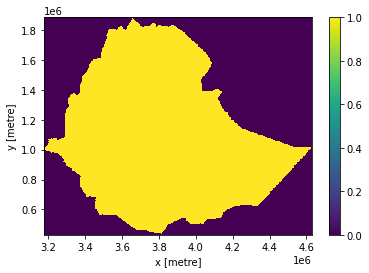

In [10]:
# Create a mask from the county polygon.
kenyan_counties = kenyan_counties.to_crs(output_crs)
mask = xr_rasterize(kenyan_counties[kenyan_counties[attribute_col] == county], ds_st)

# Mask the surface temperature dataset using the county polygon.
# Convert the xarray.Dataset to an xarray.DataArray.
ds_st = ds_st.where(mask).surface_temperature

# Plot the mask.
mask.plot();

## Temperature Drought Index

<img src="../data/TemperatureDroughtIndex.png"> 

- $\text{TDI}_{i,m}$ is the Temperature Drought Index for year $\text{i}$ and time unit (dekad/month) $\text{m}$

- $\text{T*}$ is the decadal/monthly temperature average

- $\text{IP}$ is the interest period 

- $\text{RL}^{(T)}$ (run length) is the maximum number of successive months above long-term average temperature in the $\text{IP}$ 

- $n$ is the number of years where relevant data are available,

- $j$ is the summation running parameter covering the $\text{IP}$

- $k$ is the summation parameter covering the years where relevant data are available

In a simplified form the above index can be expressed as:

\begin{aligned}
\text{TDI} = \frac{\text{Actual average for IP}}{\text{Long term average for IP}} * \sqrt{\frac{\text{Actual length of continuous excess in the IP}}{\text{Long term average of continuous excess in the IP}}}
\end{aligned}

where $\text{TDI}$ is the Temperature Drought Index and $\text{IP}$ is the interest period.

In [11]:
# Adjust the range of all variables and to avoid a division by zero.
ds_st = (ds_st.max() + 1) - ds_st

In [12]:
def get_temporal_mean(ds):
    temporal_mean = ds.mean(dim="time")
    return temporal_mean

def get_monthly_mean(ds):
    monthly_mean = ds.groupby("time.month").map(get_temporal_mean)
    return monthly_mean

# Get the average surface temperature for each month in the time series.
monthly_mean = ds_st.groupby("time.year").map(get_monthly_mean)
monthly_mean = monthly_mean.transpose("year", "month", "y", "x")

# Get the long term mean surface temperature (climatology) for each month in a year.
climatology_mean = get_monthly_mean(ds_st)

In [13]:
def get_continuous_excess(anomaly):
    # Get some of the features from the anomaly xarray.DataArray to use later.
    dims = list(anomaly.dims)
    coords = anomaly.coords

    # Convert the xarray.DataArray to a numpy array.
    anomaly_np = anomaly.data

    # Numpy array to track the count of positive anomaly values in a sequence for a pixel.
    count = np.zeros(shape=(len(coords["y"]), len(coords["x"])))
    # Numpy array to track the length of a sequence of positive anomaly values for a pixel.
    sequence_length = np.zeros(shape=(len(coords["y"]), len(coords["x"])))

    # Loop over each year present.
    stack_by_year = []
    for year_index in range(anomaly_np.shape[0]):
        year_np = anomaly_np[year_index]

        # Loop over each month in a year.
        stack_by_month = []
        for month_index in range(year_np.shape[0]):
            month_np = year_np[month_index]
            # Increase the count by 1 if the anomaly value for a pixel is positive.
            count = np.where(month_np > 0, count + 1, count)
            # Before resetting the count to zero if the anomaly value for a pixel is negative,
            # check if the current count is more than the length of the sequence of positive anomaly
            # values for a pixel.
            sequence_length = np.where(
                (month_np < 0) & (count > sequence_length), count, sequence_length
            )
            stack_by_month.append(sequence_length)
            # Reset the count to zero if we see a negative anomaly value.
            count = np.where(month_np < 0, 0, count)

        # Stack all the monthly numpy arrays for a single year.
        stacked_by_month = np.stack(stack_by_month, axis=0)
        stack_by_year.append(stacked_by_month)

    # Stack all the yearly numpy arrays together.
    stacked_by_year = np.stack(stack_by_year, axis=0)

    # Create xarray Dataarray.
    continuous_excess_length = xr.DataArray(
        data=stacked_by_year, coords=coords, dims=dims, name="surface_temperature"
    )
    return continuous_excess_length

In [14]:
# If the average surface temperature value for a month is above 
# the long term average surface temperature then the anomaly value will be positive.
anomaly = monthly_mean - climatology_mean

# Get the maximum number of successive months above the long term average surface temperature.
# i.e. the length of continuous excess.
continuous_excess_length = get_continuous_excess(anomaly).where(mask)
# Adjust the range of all variables and to avoid a division by zero.
continuous_excess_length = (continuous_excess_length.max() + 1) - continuous_excess_length

# Get the long term average of the length of continuous excess.
long_term_mean_continuous_excess_length = continuous_excess_length.groupby("month").mean("year")

In [15]:
%%time
# Calculate the Temperature Drought Index.
TDI = (monthly_mean / climatology_mean) * np.sqrt(continuous_excess_length / long_term_mean_continuous_excess_length)
# Scale the Temperature Drought Index.
TDI = (TDI - TDI.min()) / (TDI.max() - TDI.min())
TDI = TDI.compute()

CPU times: user 54min 2s, sys: 30.5 s, total: 54min 32s
Wall time: 2h 18min 25s


In [17]:
# Add a time dimension to the Temperature Drought Index xarray.DataArray.
time_list = []
data_list = []
for year in TDI.year.values:
    ds_year = TDI.sel(year=year)
    for month in ds_year.month.values:
        ds_month = ds_year.sel(month=month)
        ds_month_np = ds_month.data
        # Remove the empty months.
        if np.isnan(np.unique(ds_month_np)).all():
            continue
        else:
            data_list.append(ds_month_np)
            # Specify the time step to be the first day of the month.
            time_step = f"{year}-{month:02}-01"
            time_list.append(time_step)

        
# Convert the time_list to a numpy array.
time = np.array(time_list, dtype='datetime64[ns]')
# Stack the numpy arrays in the data_list.
data = np.stack(data_list, axis=0)

# Initialize dataset.
TDI = xr.Dataset(data_vars=dict(TDI=(["time", "y", "x"], data)),
                coords=dict(time=(["time"], time),
                            y=(["y"], TDI.y.values),
                            x=(["x"], TDI.x.values)),
                attrs=attrs)

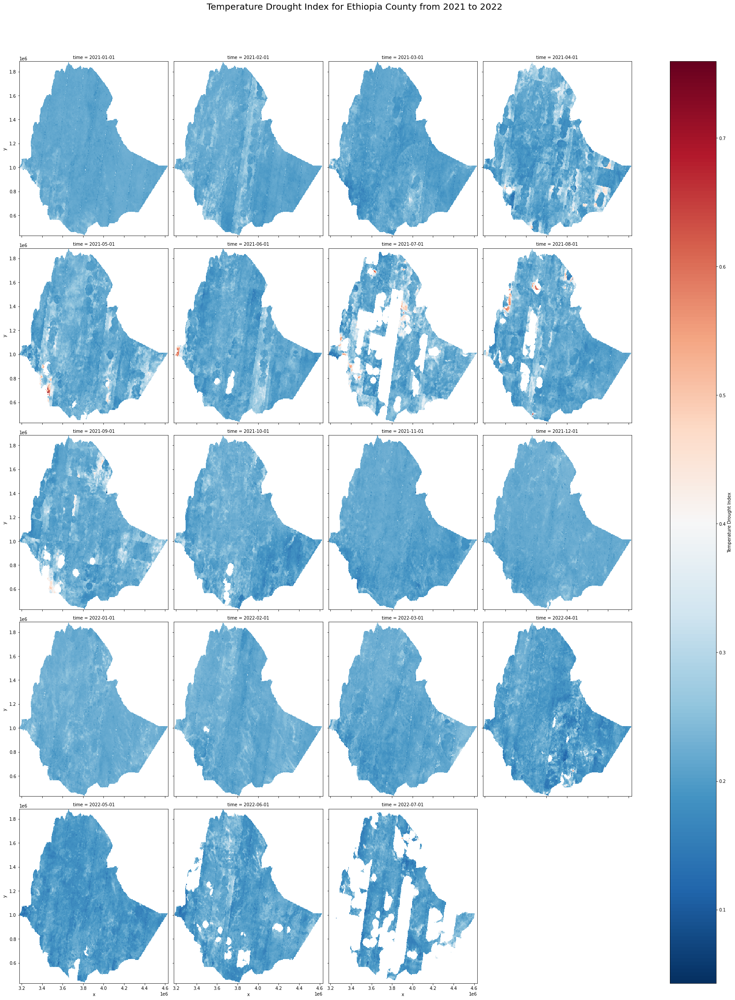

In [18]:
# Plot the Temperature Drought Index for the years 2021 and 2022.
fig = TDI.TDI.sel(time=slice("2021", "2022")).plot(
    x="x",
    y="y",
    col="time",
    col_wrap=4,
    cbar_kwargs={"label": "Temperature Drought Index"},
    size=6,
    cmap="RdBu_r",
)

fig.fig.suptitle(
    f"Temperature Drought Index for {county} County from 2021 to 2022",
    fontsize=20,
    x=0.45,
    y=1.05,
)

fig.fig.savefig(
    f"results/tdi_{county}_2021_to_2022.png", bbox_inches="tight"
)

In [19]:
# Export the Temperature Drought Index
pickled_tdi = f"{output_dir}/{county}_county_tdi.pickle"

with open(pickled_tdi, "wb") as f:
    pickle.dump(TDI, f, protocol=-1)

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Compatible datacube version:** 

In [20]:
print(datacube.__version__)

1.8.6


**Last Tested:**

In [21]:
from datetime import datetime

datetime.today().strftime("%Y-%m-%d")

'2022-07-25'